In [2]:
import pandas as pd
from bifacial_peak_shaving import *
from data_processing import *
pd.options.plotting.backend='plotly'

cfg = read_configs('caltech_ev.json')

# Data

## Load

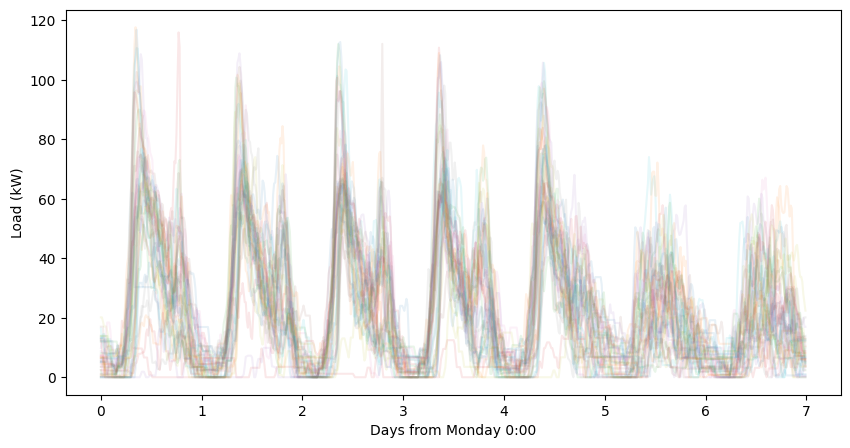

In [2]:
load = read_load_data(cfg)

plot_weekly(load['Load (kW)'])
load.plot()

## Solar

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [3]:
solar = read_and_scale_solar(cfg,load.index)

print(solar.info(),'\n')
print(solar.describe())
solar

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   s20           29184 non-null  float64
 1   s20w90_75_25  29184 non-null  float64
 2   s20w90_50_50  29184 non-null  float64
 3   s20w90_25_75  29184 non-null  float64
 4   w90           29184 non-null  float64
dtypes: float64(5)
memory usage: 1.3 MB
None 

           s20  s20w90_75_25  s20w90_50_50  s20w90_25_75      w90
count  29184.0       29184.0       29184.0       29184.0  29184.0
mean       0.0           0.0           0.0           0.0      0.0
std        0.0           0.0           0.0           0.0      0.0
min       -0.0          -0.0          -0.0          -0.0     -0.0
25%       -0.0          -0.0          -0.0          -0.0     -0.0
50%       -0.0          -0.0          -0.0          -0.0     -0.0
75%        0.0           0.0           0.0     

,s20,s20w90_75_25,s20w90_50_50,s20w90_25_75,w90
Datetime (PST),,,,,
2018-05-01 00:00:00,-0.0,-0.0,-0.0,-0.0,-0.0
2018-05-01 00:15:00,-0.0,-0.0,-0.0,-0.0,-0.0
2018-05-01 00:30:00,-0.0,-0.0,-0.0,-0.0,-0.0
2018-05-01 00:45:00,-0.0,-0.0,-0.0,-0.0,-0.0
2018-05-01 01:00:00,-0.0,-0.0,-0.0,-0.0,-0.0
...,...,...,...,...,...
2019-02-28 22:45:00,-0.0,-0.0,-0.0,-0.0,-0.0
2019-02-28 23:00:00,-0.0,-0.0,-0.0,-0.0,-0.0
2019-02-28 23:15:00,-0.0,-0.0,-0.0,-0.0,-0.0


Solar energy

In [4]:
solar.resample('1h').mean().sum()

s20             0.0
s20w90_75_25    0.0
s20w90_50_50    0.0
s20w90_25_75    0.0
w90             0.0
dtype: float64

Solar yield

In [5]:
solar.resample('1h').mean().sum()/(367*0.350)

s20             0.0
s20w90_75_25    0.0
s20w90_50_50    0.0
s20w90_25_75    0.0
w90             0.0
dtype: float64

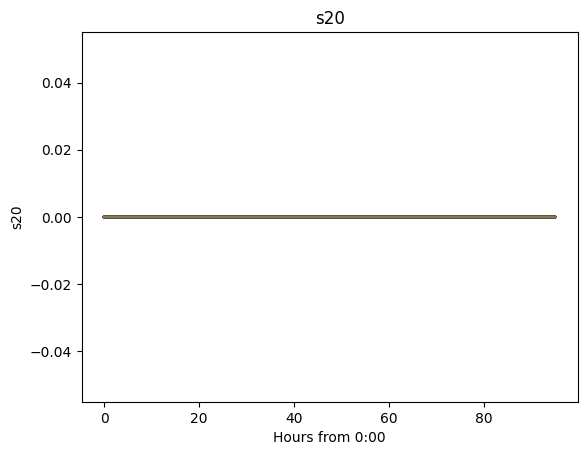

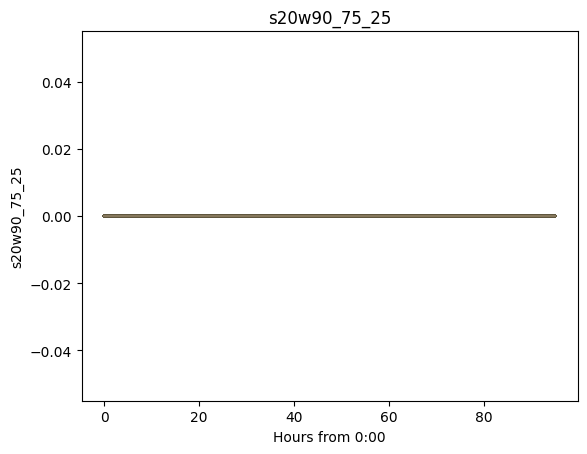

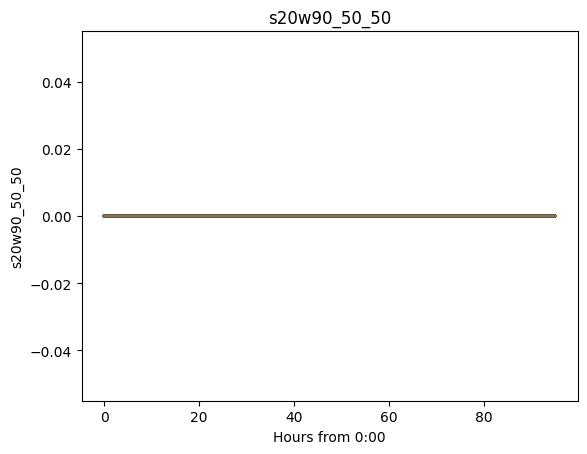

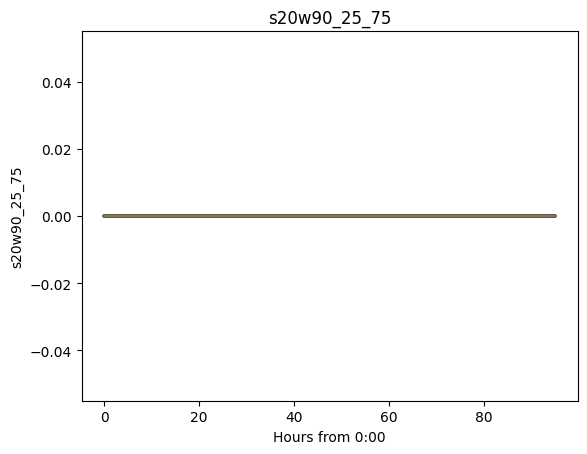

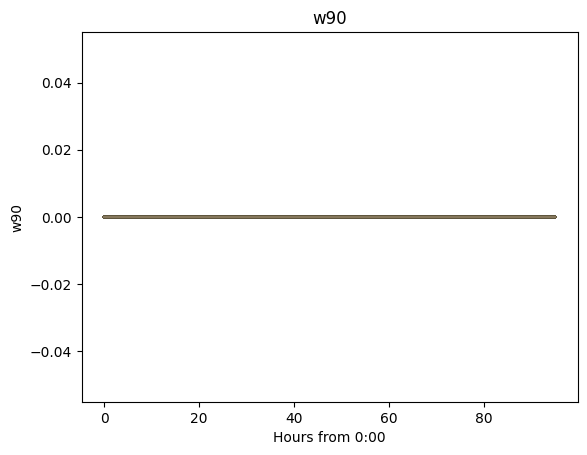

In [6]:
for col in solar:
    plot_daily(solar[col],title=col,interval_min=15)

## Net load

In [7]:
df = calculate_net_load(load,solar)        

load v s20

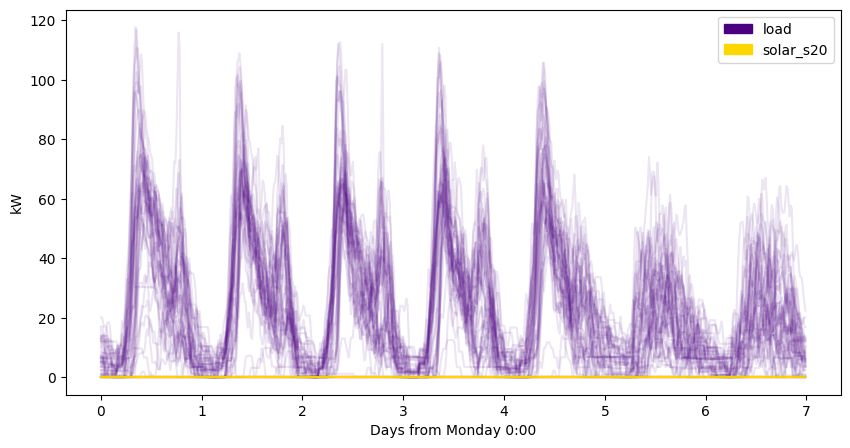

In [8]:
l = df['load']
s = df['solar_s20']
plot_weekly((l,s),ylabel='kW')

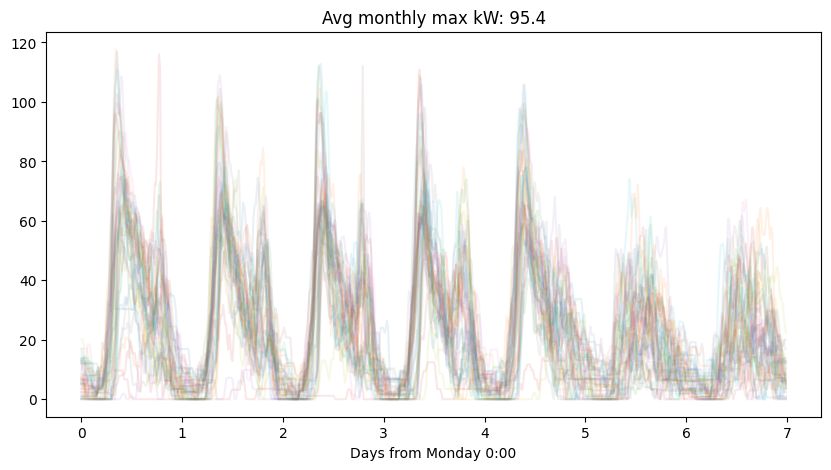

In [9]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

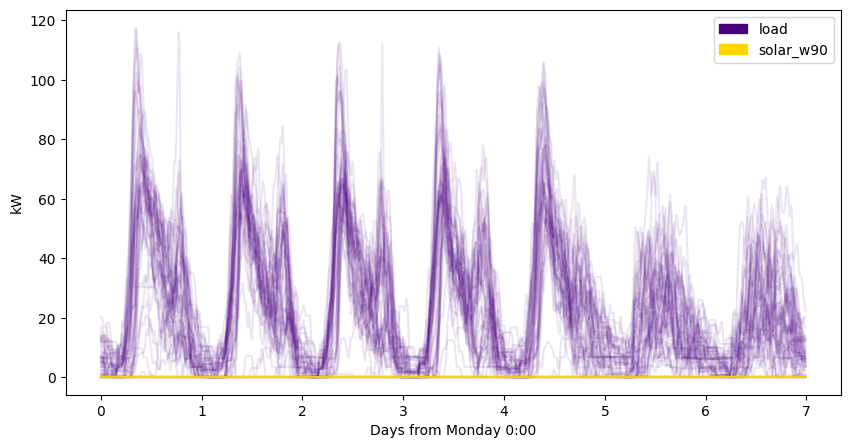

In [10]:
l = df['load']
s = df['solar_w90']
plot_weekly((l,s),ylabel='kW')

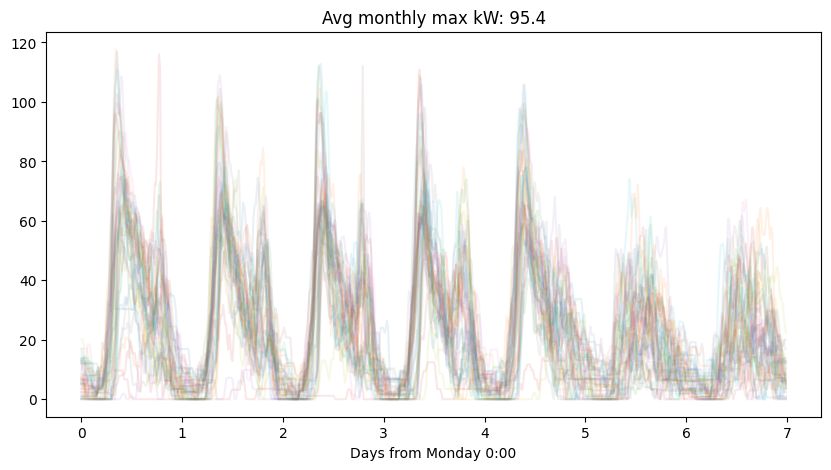

In [11]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90_50_50

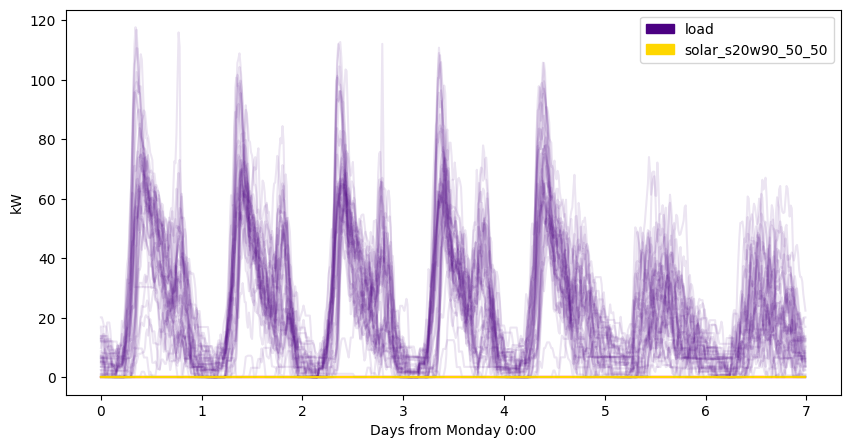

In [12]:
l = df['load']
s = df['solar_s20w90_50_50']
plot_weekly((l,s),ylabel='kW')

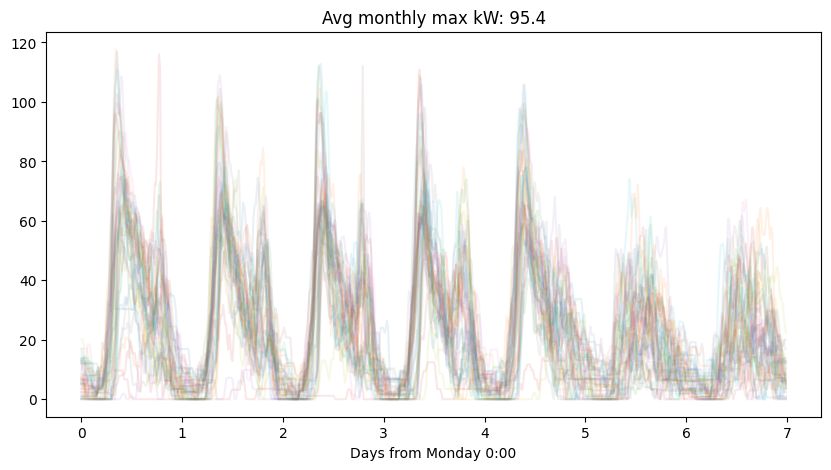

In [13]:
l = df['load']
s = df['solar_s20w90_50_50']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Baseline Costs

Load only, and net load given various solar

In [14]:
tou = TimeOfUseTariff(cfg.tou)

Tariff check: ok
Periods: 12 (overlap True)
Levels: 4


In [15]:
all_cost = {}

# # load
# cost = 0
# for year in df.index.year.unique():
#     df_year = df[df.index.year==year]
#     for month in df_year.index.month.unique():
#         df_month = df_year[df_year.index.month==month]
#         cost += calc_cost(df_month['load'],real_TOU)
# all_cost['load'] = round(cost,0)

# # net load for each solar case

load_cols = ['load'] + [f'netload_{angle}' for angle in cfg.solar_angles]

for load_col in load_cols:
    cost = 0
    for year in df.index.year.unique():
        df_year = df[df.index.year==year]
        for month in df_year.index.month.unique():
            df_month = df_year[df_year.index.month==month]
            cost += calc_cost(df_month[load_col],tou)
    all_cost[load_col] = round(cost,0)

all_cost

{'load': 54242.0,
 'netload_s20': 54242.0,
 'netload_s20w90_75_25': 54242.0,
 'netload_s20w90_50_50': 54242.0,
 'netload_s20w90_25_75': 54242.0,
 'netload_w90': 54242.0}

# Monthly Peaks

## Single TOU

In [16]:
df

,load,solar_s20,solar_s20w90_75_25,solar_s20w90_50_50,solar_s20w90_25_75,solar_w90,netload_s20,netload_s20w90_75_25,netload_s20w90_50_50,netload_s20w90_25_75,netload_w90
Datetime (PST),,,,,,,,,,,
2018-05-01 00:00:00,3.013458,-0.0,-0.0,-0.0,-0.0,-0.0,3.013458,3.013458,3.013458,3.013458,3.013458
2018-05-01 00:15:00,3.013458,-0.0,-0.0,-0.0,-0.0,-0.0,3.013458,3.013458,3.013458,3.013458,3.013458
2018-05-01 00:30:00,3.013458,-0.0,-0.0,-0.0,-0.0,-0.0,3.013458,3.013458,3.013458,3.013458,3.013458
2018-05-01 00:45:00,3.013458,-0.0,-0.0,-0.0,-0.0,-0.0,3.013458,3.013458,3.013458,3.013458,3.013458
2018-05-01 01:00:00,3.013458,-0.0,-0.0,-0.0,-0.0,-0.0,3.013458,3.013458,3.013458,3.013458,3.013458
...,...,...,...,...,...,...,...,...,...,...,...
2019-02-28 22:45:00,4.867047,-0.0,-0.0,-0.0,-0.0,-0.0,4.867047,4.867047,4.867047,4.867047,4.867047
2019-02-28 23:00:00,4.867047,-0.0,-0.0,-0.0,-0.0,-0.0,4.867047,4.867047,4.867047,4.867047,4.867047
2019-02-28 23:15:00,4.867047,-0.0,-0.0,-0.0,-0.0,-0.0,4.867047,4.867047,4.867047,4.867047,4.867047


In [17]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)
peaks

,netload_s20 kw,netload_s20 t
0,75.3,2018-05-25 09:00:00
1,83.7,2018-06-28 09:00:00
2,95.6,2018-07-24 09:15:00
3,99.0,2018-08-31 09:00:00
4,116.9,2018-09-24 08:30:00
5,117.7,2018-10-01 08:15:00
6,103.5,2018-11-28 10:15:00
7,78.2,2018-12-05 10:15:00
8,90.0,2019-01-22 10:30:00
9,80.7,2019-02-01 10:00:00


In [18]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

# angle = 'w20'
# peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
# peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90_50_50'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

#print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90_50_50 reduction',peaks['netload_s20->s20w90_50_50 reduc kw'].mean())
peaks

Avg w90 reduction 0.0
Avg s20w90_50_50 reduction 0.0


,netload_s20 kw,netload_s20 t,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90_50_50 kw,netload_s20w90_50_50 t,netload_s20->s20w90_50_50 reduc kw
0,75.3,2018-05-25 09:00:00,75.3,2018-05-25 09:00:00,0.0,75.3,2018-05-25 09:00:00,0.0
1,83.7,2018-06-28 09:00:00,83.7,2018-06-28 09:00:00,0.0,83.7,2018-06-28 09:00:00,0.0
2,95.6,2018-07-24 09:15:00,95.6,2018-07-24 09:15:00,0.0,95.6,2018-07-24 09:15:00,0.0
3,99.0,2018-08-31 09:00:00,99.0,2018-08-31 09:00:00,0.0,99.0,2018-08-31 09:00:00,0.0
4,116.9,2018-09-24 08:30:00,116.9,2018-09-24 08:30:00,0.0,116.9,2018-09-24 08:30:00,0.0
5,117.7,2018-10-01 08:15:00,117.7,2018-10-01 08:15:00,0.0,117.7,2018-10-01 08:15:00,0.0
6,103.5,2018-11-28 10:15:00,103.5,2018-11-28 10:15:00,0.0,103.5,2018-11-28 10:15:00,0.0
7,78.2,2018-12-05 10:15:00,78.2,2018-12-05 10:15:00,0.0,78.2,2018-12-05 10:15:00,0.0
8,90.0,2019-01-22 10:30:00,90.0,2019-01-22 10:30:00,0.0,90.0,2019-01-22 10:30:00,0.0
9,80.7,2019-02-01 10:00:00,80.7,2019-02-01 10:00:00,0.0,80.7,2019-02-01 10:00:00,0.0


## Variable TOU

BROKEN!

w20

In [19]:
# angle1 = 's20'
# angle2 = 'w20'

# peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
# peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

w90

In [20]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]


s20w90

In [21]:
angle1 = 's20'
angle2 = 's20w90_50_50'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]


Best for w90

In [22]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [23]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [24]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak Shaving

s20

In [25]:
angle = 's20'
thresholds = (16,16,16,13)
batt_kwh = 125
year,month,day = 2018,6,6
title='Solar South 20°, Battery 125 kWh'

fail,dispatch = peak_shaving_sim_4tou(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[f'{year}-{month}'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   tou.get(month),
                                   utility_chg_max=batt_kwh,)

cost = calc_cost(dispatch.utility,tou)

plotly_stacked_4tou( dispatch.drop(columns=['soc']).loc[f'{year}-{month}-{day}'],
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=tou.get(month)[0]['hours'], threshold0_name=f'Threshold "All Hours"',# {thresholds[0]:.1f} kW',                     
                #threshold1=thresholds[1], threshold1_h=real_TOU[1]['hours'], threshold1_name=f'Threshold "Off Peak" {thresholds[1]:.1f} kW',
                threshold1=thresholds[2], threshold1_h=tou.get(month)[2]['hours'], threshold1_name=f'Threshold "Partial Peak"',# {thresholds[2]:.1f} kW',                          
                threshold2=thresholds[3], threshold2_h=tou.get(month)[3]['hours'], threshold2_name=f'Threshold "Peak"',# {thresholds[3]:.1f} kW',                          
                #title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                title=title,
                units_power='kW',
                size=(500,500),
                ylim=(0,101),
                upsample_min=1,
                template='plotly_white',
                save_path='./peak shaving south.png')

s20w90 25 75

In [26]:
angle = 's20w90_25_75'
thresholds = (13.221,13.221,12.541,3.097)
batt_kwh = 125
year,month,day = 2018,6,6
title='Solar West 90°, Battery 125 kWh'

fail,dispatch = peak_shaving_sim_4tou(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[f'{year}-{month}'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   tou.get(month),
                                   utility_chg_max=batt_kwh,)

cost = calc_cost(dispatch.utility,tou)

plotly_stacked_4tou( dispatch.drop(columns=['soc']).loc[f'{year}-{month}-{day}'],
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=tou.get(month)[0]['hours'], threshold0_name=f'Threshold "All Hours" {thresholds[0]:.1f} kW',                     
                #threshold1=thresholds[1], threshold1_h=real_TOU[1]['hours'], threshold1_name=f'Threshold "Off Peak" {thresholds[1]:.1f} kW',
                threshold1=thresholds[2], threshold1_h=tou.get(month)[2]['hours'], threshold1_name=f'Threshold "Partial Peak" {thresholds[2]:.1f} kW',                          
                threshold2=thresholds[3], threshold2_h=tou.get(month)[3]['hours'], threshold2_name=f'Threshold "Peak" {thresholds[3]:.1f} kW',                          
                #title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                title=title,
                units_power='kW',
                size=(500,500),
                ylim=(0,101),
                upsample_min=1,
                template='plotly_white',
                save_path='./peak shaving west.png')

In [27]:
dispatch.sum()

load                    67721.315621
solar_s20w90_25_75          0.000000
netload_s20w90_25_75    67721.315621
batt                     -983.099821
soe                     48120.983109
utility                 68704.415443
soc                       384.967865
dtype: float64

## Minimize Cost

Grid search rough, fine, and gradient descent

In [29]:
cfg.batt_kwhs = [25,50,75,100,125,150,200,400,600]

optimize_thresholds(cfg,df,tou,test=True)


2023-12-22 17:22:00.256474 Angle s20 batt_kwh 25 begin new month 2018-5
2023-12-22 17:22:18.944305 (+18s) Rough grid search done for 2018-5 thresholds=(60.0,60.0,60.0,40.0), cost=3564.4 
2023-12-22 17:23:06.496794 (+47s) Fine grid search done for 2018-5 thresholds=(59.0,59.0,59.0,39.0), cost=3536.4 
2023-12-22 17:23:23.554458 (+17s) Gradient descent done for 2018-5 thresholds=(56.6,56.6,56.6,40.1), cost=3477.5 
Elapsed 0 days 00:01:23.312432


# Results

In [6]:
pd.options.plotting.backend='matplotlib'
pd.set_option('display.float_format', lambda x: f'{x:.1f}')

lookup_names = {'s20':'South 20°',
                'w90':'100% West 90°',
                's20w90_25_75':'75% West 90°',
                's20w90_50_50':'50% West 90°',
                's20w90_75_25':'25% West 90°',}

In [7]:
results = reload_outputs(r'Output/caltech_ev_v17__GPU_s1.0_231214_210448.csv')
# results = results[['s20','s20w90_50_50','w90','s20w90_50_50 red','w90 red','s20w90_50_50 red%','w90 red%']]
# results.columns = ['Cost South 20° [$]','Cost 50% South 20° / 50% West 90° [$]','Cost West 90° [$]',
#                    'Cost Reduction 50% South 20° / 50% West 90° [$]','Cost Reduction West 90° [$]',
#                    'Cost Reduction 50% South 20° / 50% West 90° [%]','Cost Reduction West 90° [%]']
results.index = results.index.rename('Battery [kWh]')
results

,s20,s20w90_75_25,s20w90_50_50,s20w90_25_75,w90,s20w90_75_25 red,s20w90_50_50 red,s20w90_25_75 red,w90 red,s20w90_75_25 red%,s20w90_50_50 red%,s20w90_25_75 red%,w90 red%
Battery [kWh],,,,,,,,,,,,,
10,34398.0,33969.0,33232.0,33506.0,34499.0,429.0,1166.0,892.0,-101.0,1.2,3.4,2.6,-0.3
25,31317.0,30577.0,30393.0,30842.0,31726.0,740.0,924.0,475.0,-409.0,2.4,3.0,1.5,-1.3
50,27133.0,26141.0,25750.0,26134.0,27028.0,992.0,1383.0,999.0,105.0,3.7,5.1,3.7,0.4
75,23926.0,22981.0,22782.0,22846.0,23620.0,945.0,1144.0,1080.0,306.0,4.0,4.8,4.5,1.3
100,21286.0,20351.0,19805.0,20035.0,20810.0,935.0,1481.0,1251.0,476.0,4.4,7.0,5.9,2.2
125,18956.0,18036.0,17631.0,17763.0,18563.0,920.0,1325.0,1193.0,393.0,4.8,7.0,6.3,2.1
150,17119.0,16189.0,15847.0,16278.0,17258.0,930.0,1272.0,841.0,-139.0,5.4,7.4,4.9,-0.8
175,15626.0,15068.0,14804.0,15120.0,16244.0,558.0,822.0,506.0,-618.0,3.6,5.3,3.2,-4.0
200,14538.0,13842.0,13694.0,14143.0,15288.0,696.0,844.0,395.0,-750.0,4.8,5.8,2.7,-5.2


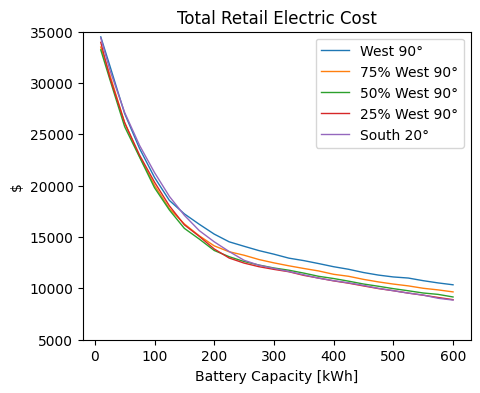

In [9]:
#cols = ['s20','s20w90_75_25','s20w90_50_50','s20w90_25_75','w90']
cols = ['w90','s20w90_25_75','s20w90_50_50','s20w90_75_25','s20']

fig = results[cols].plot( title='Total Retail Electric Cost',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[5000,35000],
                            figsize=[5,4],
                            );

fig.legend(labels=['West 90°',
                   '75% West 90°',
                   '50% West 90°',
                   '25% West 90°',
                   'South 20°',
                   ]);

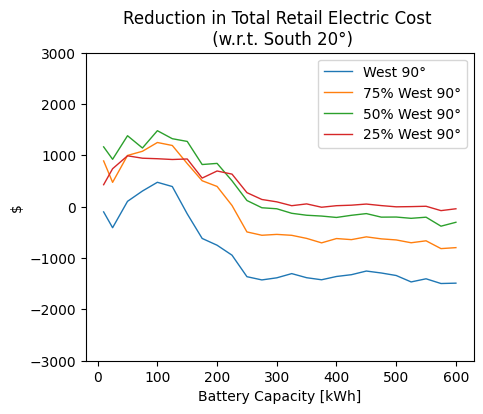

In [10]:
fig = results[[x+' red' for x in cols[:-1]]].plot( title='Reduction in Total Retail Electric Cost \n (w.r.t. South 20°)',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[-3000,3000],
                            figsize=[5,4],
                            );

fig.legend(labels=['West 90°',
                   '75% West 90°',
                   '50% West 90°',
                   '25% West 90°',
                   ]);

## Peak 16-18

In [16]:
results = reload_outputs(r'Output/caltech_ev_pk16-18_v17__GPU_s1.0_231222_1809.csv')
# results = results[['s20','s20w90_50_50','w90','s20w90_50_50 red','w90 red','s20w90_50_50 red%','w90 red%']]
# results.columns = ['Cost South 20° [$]','Cost 50% South 20° / 50% West 90° [$]','Cost West 90° [$]',
#                    'Cost Reduction 50% South 20° / 50% West 90° [$]','Cost Reduction West 90° [$]',
#                    'Cost Reduction 50% South 20° / 50% West 90° [%]','Cost Reduction West 90° [%]']
results.index = results.index.rename('Battery [kWh]')
results

,s20,s20w90_75_25,s20w90_50_50,s20w90_25_75,w90,s20w90_75_25 red,s20w90_50_50 red,s20w90_25_75 red,w90 red,s20w90_75_25 red%,s20w90_50_50 red%,s20w90_25_75 red%,w90 red%
Battery [kWh],,,,,,,,,,,,,
10,30224.0,28749.0,27727.0,27751.0,28733.0,1475.0,2497.0,2473.0,1491.0,4.9,8.3,8.2,4.9
25,26337.0,25134.0,24292.0,24458.0,25318.0,1203.0,2045.0,1879.0,1019.0,4.6,7.8,7.1,3.9
50,21944.0,20649.0,20022.0,20205.0,20892.0,1295.0,1922.0,1739.0,1052.0,5.9,8.8,7.9,4.8
75,19073.0,17966.0,17432.0,17576.0,18359.0,1107.0,1641.0,1497.0,714.0,5.8,8.6,7.8,3.7
100,17133.0,16082.0,15500.0,15631.0,16437.0,1051.0,1633.0,1502.0,696.0,6.1,9.5,8.8,4.1
125,15499.0,14417.0,13946.0,14218.0,15182.0,1082.0,1553.0,1281.0,317.0,7.0,10.0,8.3,2.0
150,14124.0,13234.0,12861.0,13292.0,14499.0,890.0,1263.0,832.0,-375.0,6.3,8.9,5.9,-2.7
175,12914.0,12193.0,12099.0,12671.0,13905.0,721.0,815.0,243.0,-991.0,5.6,6.3,1.9,-7.7
200,12033.0,11497.0,11665.0,12236.0,13306.0,536.0,368.0,-203.0,-1273.0,4.5,3.1,-1.7,-10.6


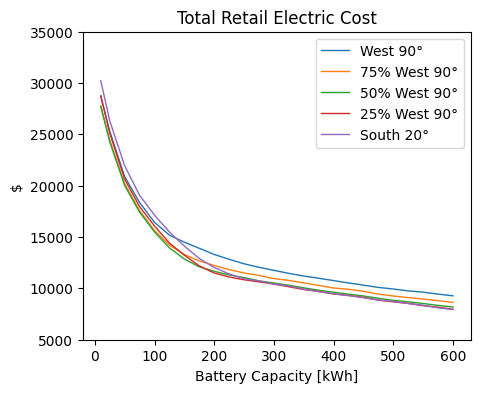

In [17]:
#cols = ['s20','s20w90_75_25','s20w90_50_50','s20w90_25_75','w90']
cols = ['w90','s20w90_25_75','s20w90_50_50','s20w90_75_25','s20']

fig = results[cols].plot( title='Total Retail Electric Cost',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[5000,35000],
                            figsize=[5,4],
                            );

fig.legend(labels=['West 90°',
                   '75% West 90°',
                   '50% West 90°',
                   '25% West 90°',
                   'South 20°',
                   ]);

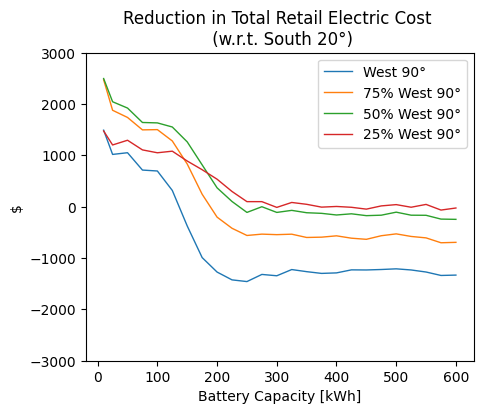

In [18]:
fig = results[[x+' red' for x in cols[:-1]]].plot( title='Reduction in Total Retail Electric Cost \n (w.r.t. South 20°)',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[-3000,3000],
                            figsize=[5,4],
                            );

fig.legend(labels=['West 90°',
                   '75% West 90°',
                   '50% West 90°',
                   '25% West 90°',
                   ]);

## All solar

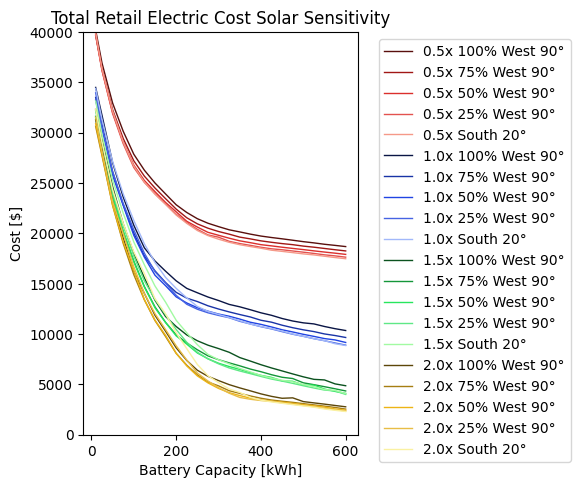

In [23]:
results_05 = reload_outputs(r'Output/caltech_ev_v17__GPU_s0.5_231220_2327.csv')[cols]
results_05.columns = ['0.5x '+x for x in results_05.columns]
results_10 = reload_outputs(r'Output/caltech_ev_v17__GPU_s1.0_231214_210448.csv')[cols]
results_10.columns = ['1.0x '+x for x in results_10.columns]
results_15 = reload_outputs(r'Output/caltech_ev_v17__GPU_s1.5_231220_2325.csv')[cols]
results_15.columns = ['1.5x '+x for x in results_15.columns]
results_20 = reload_outputs(r'Output/caltech_ev_v17__GPU_s2.0_231220_2326.csv')[cols]
results_20.columns = ['2.0x '+x for x in results_20.columns]

results = pd.concat((results_05,results_10,results_15,results_20),axis=1)

fig = results.plot( title='Total Retail Electric Cost Solar Sensitivity',
                            ylabel='Cost [$]',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            # color = ['#590f0d','#0a1545','#0b521f','#5c4609',
                            #          '#a11715','#1933a6','#149639','#a67e12',
                            #          '#db2f2c','#2044e3','#27e65d','#edb415',
                            #          '#e3524f','#4663e3','#5fe886','#e8bd46'],
                            color=['#590f0d','#a11715','#db2f2c','#e3524f','#f59989', # red
                                   '#0a1545','#1933a6','#2044e3','#4663e3','#a2b8fa', # blue
                                   '#0b521f','#149639','#27e65d','#5fe886','#a2faa2', # green
                                   '#5c4609','#a67e12','#edb415','#e8bd46','#faf1a2'], # yellow
                            ylim=[0,40000],
                            figsize=[6,5],
                            );

fig.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left',
           labels=[' '.join(x.split(' ')[:-1]) + ' ' + lookup_names[x.split(' ')[-1]] for x in results.columns],);
plt.tight_layout()

plt.savefig(#'total cost reduction solar sensitivity.png',
              'Paper/tex/images/total cost reduction solar sensitivity.png',
            transparent=True
            )

#plt.show()
       

# Etc

In [ ]:
r[['deltac']][k:].dropna().rolling(100).std().plot()

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th0',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th1',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th2',y='c',color='i',width=800,height=400)

In [ ]:
r.loc[k+1:][['th0','th1','c']].plot.scatter(x='th0',y='th1',color='c')

In [ ]:
r.loc[k+1:][['th0','th2','c']].plot.scatter(x='th0',y='th2',color='c')

## CF Shape

In [ ]:
import numpy as np

TH0 = np.empty((500,3))
TH0

array([[6.95171738e-310, 6.95171738e-310, 4.68937172e-310],
       [4.68937172e-310, 4.94065646e-324, 4.68937172e-310],
       [4.94065646e-324, 4.68937172e-310, 6.95165821e-310],
       ...,
       [6.95171692e-310, 6.95163184e-310, 6.95171692e-310],
       [6.95163184e-310, 6.95171692e-310, 6.95163184e-310],
       [6.95171692e-310, 6.95163180e-310, 6.95171692e-310]])

In [ ]:
import numpy as np

def shuffle_along_axis(a, axis=0):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)


th012_values = np.empty((50**3,3))

i = 0
for th0 in [x for x in range(50)]:
    for th1 in [x for x in range(50)]:
        for th2 in [x for x in range(50)]:
            th012_values[i,0] = th0
            th012_values[i,1] = th1
            th012_values[i,2] = th2
            i += 1
            
th012_values = shuffle_along_axis(th012_values)

TH0 =  np.empty(50**3)
TH1 =  np.empty(50**3)
TH2 =  np.empty(50**3)
C =    np.empty(50**3)
FAIL = np.empty(50**3)

angle = 's20'
_df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']].copy(deep=True)

for i in range(len(th012_values)):
    th0 = th012_values[i,0]
    th1 = th012_values[i,1]
    th2 = th012_values[i,2]

    if (th0>=th1) and (th0>=th2):
        fail,dispatch = peak_shaving_sim(   _df,
                                            f'netload_{angle}',
                                            100,
                                            [th0,th1,th2],
                                            TOU,
                                            utility_chg_max=100,)                
        cost = calc_cost(dispatch.utility,TOU)
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = cost
        FAIL[i] = fail
        #print(i,th0,th1,th2,cost,fail)
    else:
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = np.nan
        FAIL[i] = np.nan
        #print(i,th0,th1,th2,np.nan,np.nan)

In [ ]:
pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL}).to_csv('CFshape.csv')

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r, x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r[r.th2==0], x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata


#df = pd.read_csv('./test_data.csv')

rth01 = r[r.th2==0]

x = np.array(rth01.th0)
y = np.array(rth01.th1)
z = np.array(rth01.c)


xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x,y),z,(X,Y), method='cubic')

fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.show()

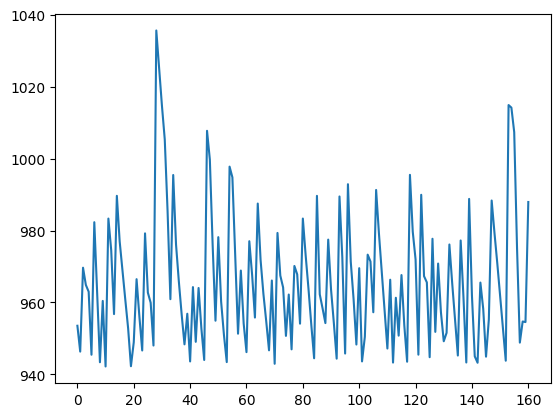

In [ ]:
plt.plot(c)

In [ ]:
r = pd.read_csv('CFshape.csv',index_col=0)
r = r[r.th2==0]
r = r.sort_values(['th0','th1'])
#r = r.sort_values('th1')
r.head(25)

,th0,th1,th2,c,fail
108640,0.0,0.0,0.0,2539.724706,1.0
82092,0.0,2.0,0.0,NaN,NaN
102988,0.0,2.0,0.0,NaN,NaN
82222,0.0,3.0,0.0,NaN,NaN
109015,0.0,3.0,0.0,NaN,NaN
74508,0.0,5.0,0.0,NaN,NaN
116422,0.0,5.0,0.0,NaN,NaN
49728,0.0,7.0,0.0,NaN,NaN
39407,0.0,8.0,0.0,NaN,NaN
85,0.0,9.0,0.0,NaN,NaN


MemoryError: Unable to allocate 4.55 TiB for an array with shape (250000000, 2500) and data type float64

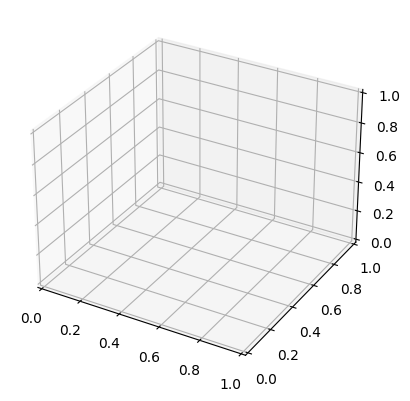

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

r = pd.read_csv('CFshape.csv')

# Make data.
X = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th0)
Y = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th1)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
Z = np.array(r[r.th2==0].c)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()